<a href="https://colab.research.google.com/github/EvgenEgorov/transcriptomics_msu_HW/blob/main/HW2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Семинар 2. EM-алгоритм и kallisto

На этом семинаре мы разберём основы работы EM-алгоритма, а позже попытаемся реализовать его в контексте работы `kallisto`, а также запустим работу `kallisto` на тестовых данных.

## EM-алгоритм для кластеризации двумерных данных

На этом шаге мы step-by-step разберём, как работает EM-алгоритм для определения максимально правдоподобных кластеров в данных на плоскости.

Для начала загрузим датасет, с которым будем работать:

In [9]:
!gdown --id 17mf6RUEFOJ19t2zNuFlswSUs7MODwLlk

/usr/local/lib/python3.8/dist-packages/gdown/cli.py:127: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=17mf6RUEFOJ19t2zNuFlswSUs7MODwLlk
To: /content/EM_dataset.csv
100% 12.6k/12.6k [00:00<00:00, 14.6MB/s]


Теперь посмотрим, что он из себя представляет, построив диаграмму рассеяния (да, именно так переводится *scatterplot*):

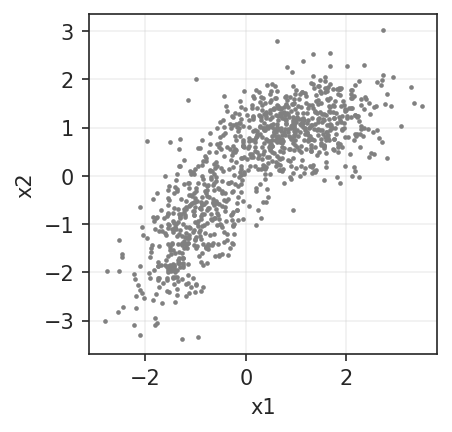

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

sns.set_style("ticks")
df = pd.read_csv("EM_dataset.csv")
fig, ax = plt.subplots(figsize=(3, 3), dpi=150)
sns.scatterplot(x="x1", y="x2", data=df, s=5, color="grey", linewidth=0, ax=ax)
ax.grid(alpha=0.3)

Теперь разберёмся с тем, как именно реализуется алгоритм EM.

Допустим, мы ожидаем увидеть тут два кластера. Априортное распределение количества точек в кластерах $\phi$ ($p(y)$) будет распределено биномиально (то есть есть некоторая вероятность, что точки принадлежат к одному или другому кластеру). Иногда эту вероятность имеет смысл задать явно (когда у нас действительно есть представление о том, как точки должны быть распределены между кластерами), однако в любом случае она будет оптимизироваться и далее.

Вероятность того, что точка принадлежит к кластеру ($p(x | y)$) распределена по Гауссиане с параметрами $\mu$ и $\sigma$.

Таким образом, наша система описывается следующими параметрами
$\theta := \phi, \mu_1, \sigma_1, \mu_2, \sigma_2$. Зададим их изначально случайно.

In [11]:
import numpy as np

def get_random_psd(n=2):
    x = np.random.normal(0, 1, size=(n, n))
    return np.dot(x, x.transpose())

params = {
    "phi" : np.random.uniform(0, 1), # Доля точек, принадлежащих к кластеру 1

    "mu1" : np.random.normal(0, 1, size=2), # Центр распределения 1
    "mu2" : np.random.normal(0, 1, size=2), # Центр распределения 2
    
    "sigma1": get_random_psd(), # У 2d Гауссианы таким образом задаётся дисперсия
    "sigma2" : get_random_psd() # У 2d Гауссианы таким образом задаётся дисперсия
}

for param in params:
  print(f"{param}:")
  print(params[param], "\n")

phi:
0.8629031520195116 

mu1:
[0.18427312 0.77387712] 

mu2:
[1.3614597  1.51254576] 

sigma1:
[[ 1.79602078 -0.05553501]
 [-0.05553501  0.11035661]] 

sigma2:
[[ 0.41214185 -0.12211991]
 [-0.12211991  0.12267655]] 



Теперь отрисуем эти распределения (пока без точек):

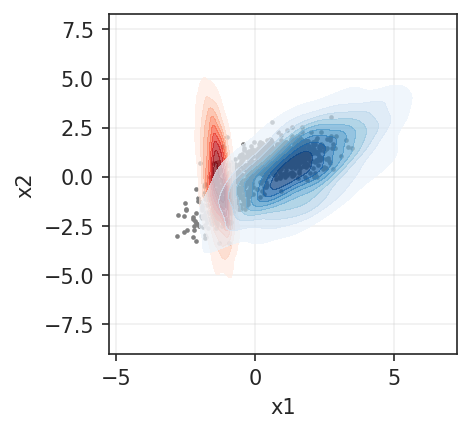

In [ ]:
import scipy.stats as stats

hist1 = stats.multivariate_normal(params["mu1"], params["sigma1"]).rvs(size=1000)
hist2 = stats.multivariate_normal(params["mu2"], params["sigma2"]).rvs(size=1000)

fig, ax = plt.subplots(figsize=(3, 3), dpi=150)
sns.scatterplot(x="x1", y="x2", data=df, s=5, linewidth=0, ax=ax, color="grey")
sns.kdeplot(x=hist1[:, 0], y=hist1[:, 1], ax=ax, cmap="Reds", fill=True, alpha=0.7)
sns.kdeplot(x=hist2[:, 0], y=hist2[:, 1], ax=ax, cmap="Blues", fill=True, alpha=0.7)
ax.grid(alpha=0.3)

Итак, мы получили изначальные параметры, которые мы будем оптимизировать. Как происходит оптимизация этих параметров в EM-алгоритме? В целом логика примерно та же, что и в K-Means (для тех, кто знаком, если не знакомы &mdash; мы будем разбирать этот алгоритм в ходе курса позднее).

На E-шаге мы будем для каждой точки считать вероятности принадлежности каждой из точек к тому или иному кластеру.

$$b_i = P(b | x_i) = \frac{P(x_i|b)P(b)}{P(x_i|a)P(a) + P(x_i|b)P(b)} = \frac{(\mathrm{Likelihood\;of\;x_i\;from\;b} )*(\mathrm{Prior\;probability\;of\;b})}{\mathrm{Total\;probability\;of\;x_i}} = \frac{A * B}{C} = \frac{D}{C}$$

В логарифмической форме это будет выглядеть как $$\log{b_i} = \log{P(b_i|x)} = \log{P(x_i|b)} + \log{P(b)} - \log{(P(x_i|a)P(a) + P(x_i|b)P(b))} = \mathrm{LogLikelihood} + \mathrm{Prior} - \mathrm{Total\;probability} = \log{A} + \log{B} - \log{C}$$

<b>Подсказка для понимания</b>: представьте, что $P(a) = P(b) = 0.5$. Выражение упростится до $$b_i = P(b|x_i) = \frac{P(x_i|b)}{P(x_i|b) + P(x_i|a)},$$ то есть до отношения правдоподобия того, что точка порождена распределением $b$, к сумме правдоподобий того, что точка порождена распределением $b$ и распределением $a$.

In [ ]:
from scipy.special import logsumexp

X = df.values

def E_step(X, params, draw=False):
  LogLikelihood = A = np.log([
      stats.multivariate_normal(params["mu1"], params["sigma1"]).pdf(X), 
      stats.multivariate_normal(params["mu2"], params["sigma2"]).pdf(X)
  ])
  logPrior = B = np.log([1 - params["phi"], params["phi"]])
  logPosterior = D = logPrior + LogLikelihood.T
  RealSoftMax = C = logsumexp(logPosterior, axis=1)
  probabilities = np.exp(logPosterior - np.array([RealSoftMax]).T)

  if draw:
    hist1 = stats.multivariate_normal(params["mu1"], params["sigma1"]).rvs(size=1000)
    hist2 = stats.multivariate_normal(params["mu2"], params["sigma2"]).rvs(size=1000)

    fig, axes = plt.subplots(figsize=(6, 3), dpi=150, ncols=2)
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=probabilities[:, 0], linewidth=0,
                    palette="coolwarm", ax=axes[1], s=3, alpha=1)
    sns.scatterplot(x=X[:, 0], y=X[:, 1], linewidth=0, ax=axes[0], s=3, alpha=1, color="grey")
    sns.kdeplot(x=hist1[:, 0], y=hist1[:, 1], ax=axes[0], cmap="Reds", fill=True, alpha=0.5)
    sns.kdeplot(x=hist2[:, 0], y=hist2[:, 1], ax=axes[0], cmap="Blues", fill=True, alpha=0.5)
    axes[0].grid(alpha=0.3)
    axes[1].grid(alpha=0.3)
    axes[1].legend().remove()
    axes[0].set_xlim(-4, 4)
    axes[1].set_xlim(-4, 4)
    axes[0].set_ylim(-4, 4)
    axes[1].set_ylim(-4, 4)
    plt.show()

  return RealSoftMax, probabilities

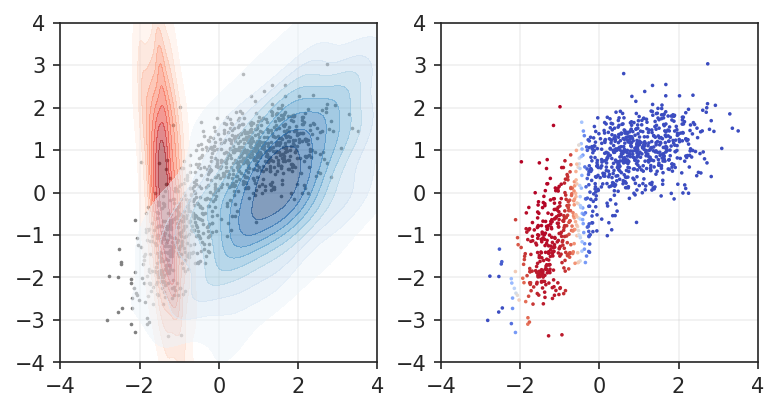

In [ ]:
total_prob, probabilities = E_step(X, params, draw=True)

На следующеи шаге мы будем оптимизировать параметр $\theta$ по тому, как мы определили принадлежность точек к кластерам на E-шаге.

In [ ]:
def M_step(X, params, probabilities):
  prob_1 = probabilities[:, 0]
  prob_2 = probabilities[:, 1]

  # Вычисление новых значений
  # Пропорция = prior
  phi = prob_1.sum() / len(X)

  # Среднее
  mu1 = prob_1.dot(X) / np.sum(prob_1)
  mu2 = prob_2.dot(X) / np.sum(prob_2)

  # Дисперсия
  sigma1 = (X - mu1).T.dot((X - mu1) * np.array([prob_1]).T) / np.sum(prob_1)
  sigma2 = (X - mu2).T.dot((X - mu2) * np.array([prob_2]).T) / np.sum(prob_2)
  
  return {
      "phi" : phi,
      "mu1" : mu1, "mu2" : mu2,
      "sigma1": sigma1, "sigma2": sigma2
  }

Сделаем так, чтобы это выполнялось до тех пор, пока LogLikelihood не перестанет уменьшаться меньше, чем на 0.0001.

In [ ]:
def run_EM(X, params, draw=False):
    import imageio
    avg_allprob = []

    while True:
        allprob, probabilities = E_step(X, params, draw=draw)
        avg_allprob.append(np.mean(allprob))
        if len(avg_allprob) > 2 and abs(avg_allprob[-1] - avg_allprob[-2]) < 0.00001:
            break
        params = M_step(X, params, probabilities)
        
    loglikelihood, probabilities = E_step(X, params)
    forecasts = np.argmax(probabilities, axis=1)
    return forecasts, probabilities, avg_allprob

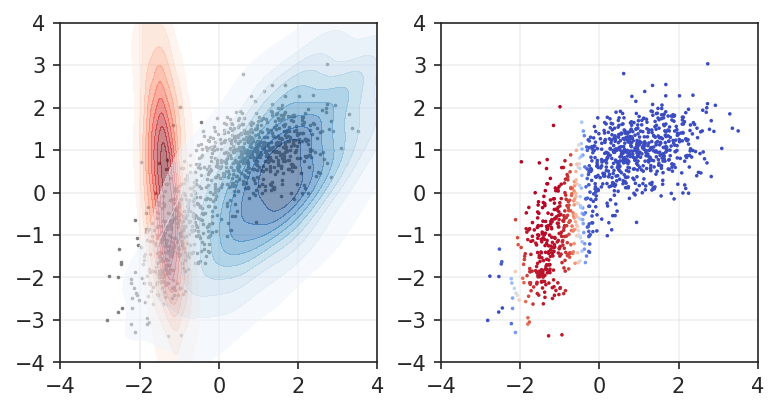

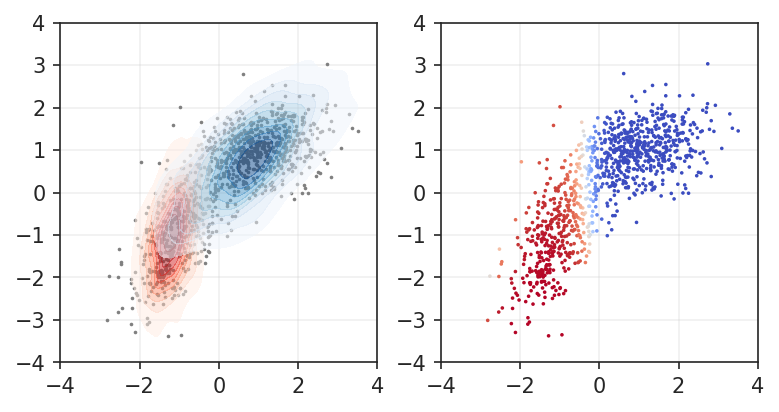

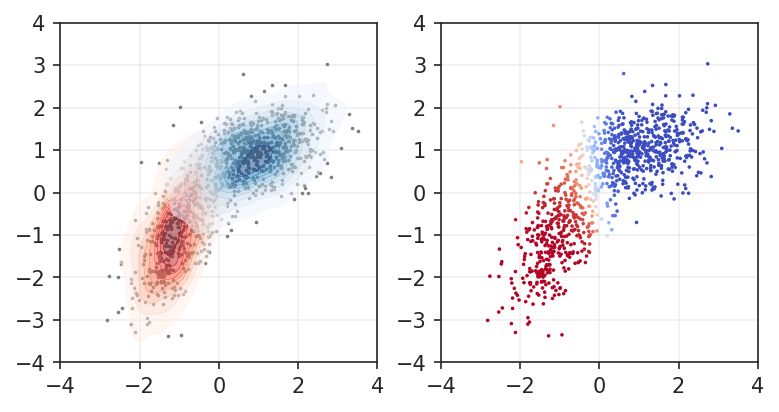

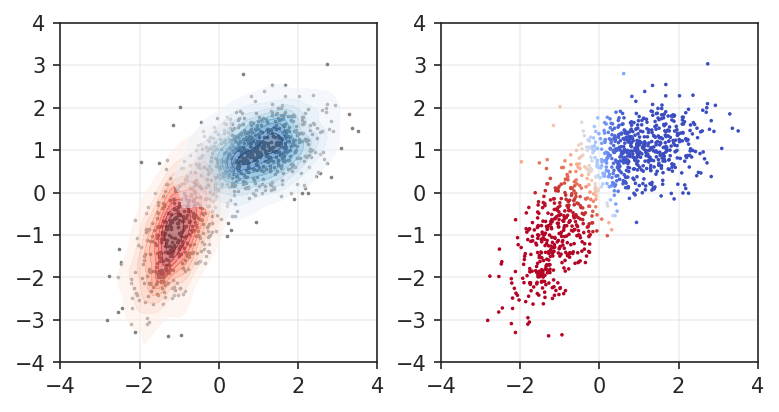

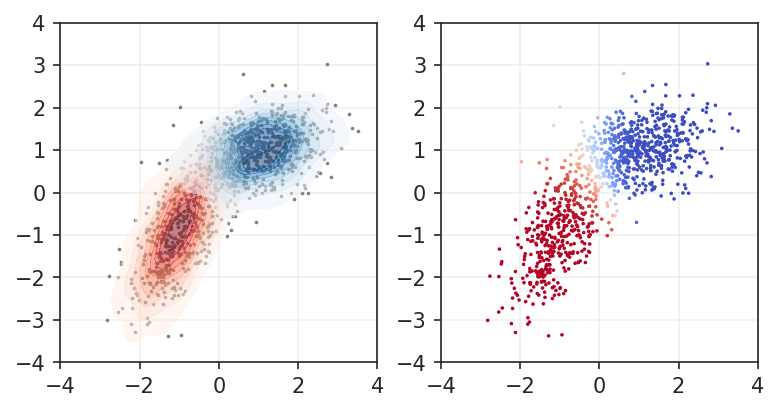

...

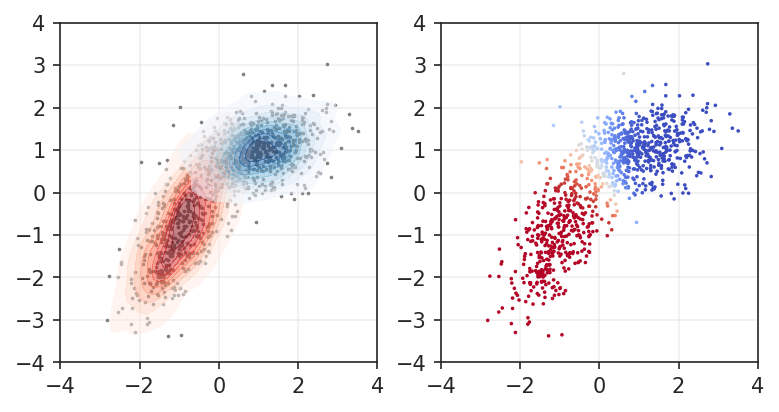

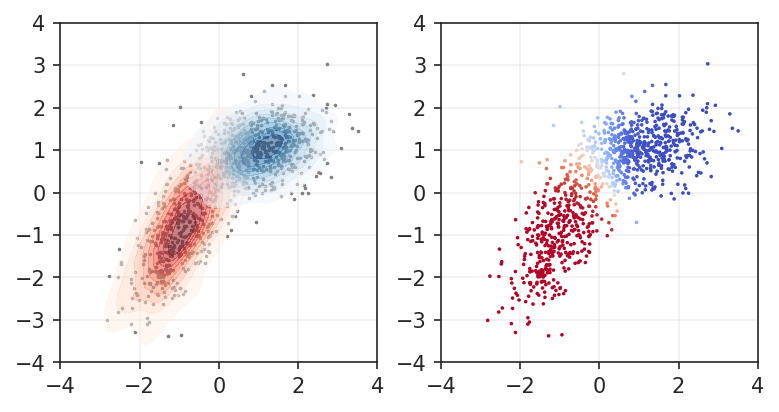

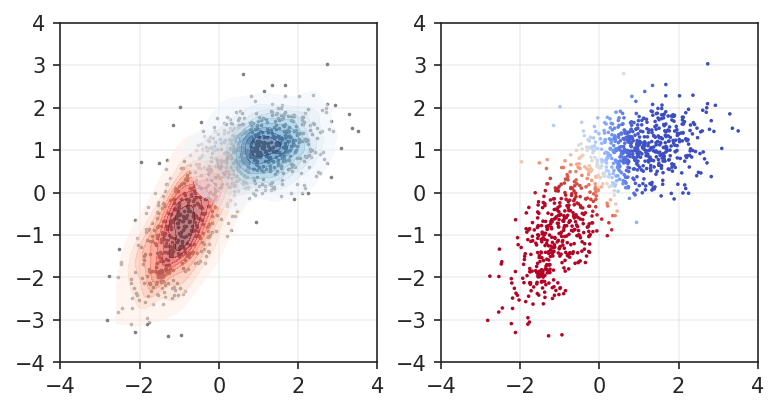

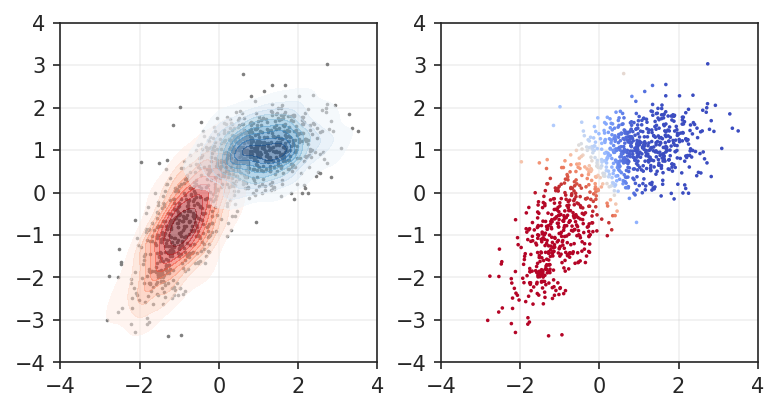

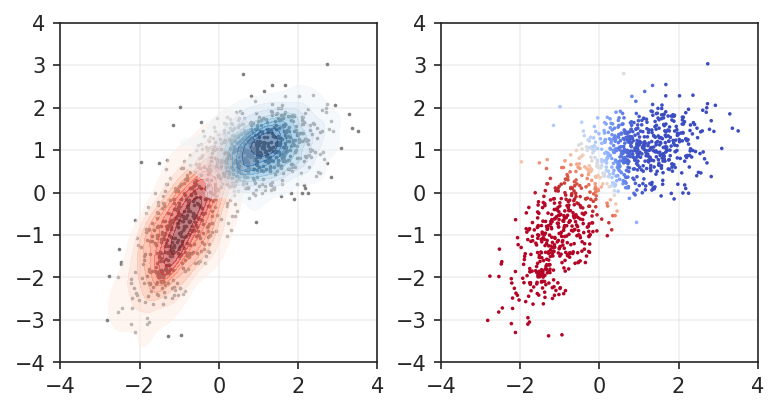

In [ ]:
pred, prob, allprob = run_EM(X, params, draw=True)

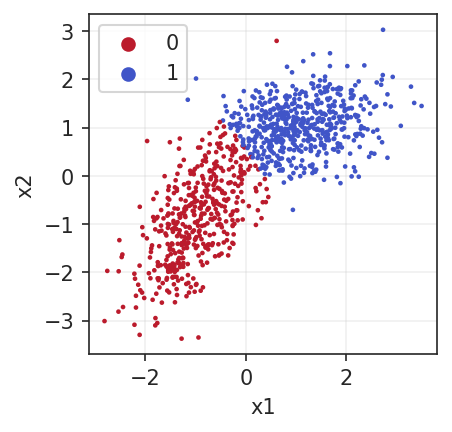

In [ ]:
fig, ax = plt.subplots(figsize=(3, 3), dpi=150)
sns.scatterplot(x="x1", y="x2", data=df, s=5, linewidth=0, ax=ax, hue=pred,
                palette={0: sns.color_palette("coolwarm", n_colors=50)[-1],
                         1: sns.color_palette("coolwarm", n_colors=50)[0]})
ax.grid(alpha=0.3)

## Kallisto

В отличие от других подходов, в kallisto отсутствует стадия выравнивания прочтений на референсный геном или транскриптом. Данный подход строит граф де Брёйна из k-меров транскриптома, после k-меры прочтений образуют пути в этом графе. Основываясь на этих путях, производится максимально правдоподобная оценка экспрессий различных транскриптов.

Подробнее про работу метода можно прочитать <a href="https://bioinfo.iric.ca/understanding-how-kallisto-works/#:~:text=The%20idea%20behind%20kallisto%20is,(not%20the%20whole%20genome)." target="_blank">здесь</a>. Первым шагом мы загрузим kallisto из git-репозитория и установим эту программу.

In [1]:
!git clone https://github.com/pachterlab/kallisto.git
!apt-get install autoconf
!cd kallisto && mkdir build && cd build && cmake .. && make

Cloning into 'kallisto'...
remote: Enumerating objects: 4140, done.
remote: Counting objects: 100% (154/154), done.
remote: Compressing objects: 100% (79/79), done.
remote: Total 4140 (delta 82), reused 118 (delta 67), pack-reused 3986
Receiving objects: 100% (4140/4140), 4.24 MiB | 13.88 MiB/s, done.
Resolving deltas: 100% (2697/2697), done.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  automake autotools-dev libsigsegv2 m4
Suggested packages:
  autoconf-archive gnu-standards autoconf-doc libtool gettext m4-doc
The following NEW packages will be installed:
  autoconf automake autotools-dev libsigsegv2 m4
0 upgraded, 5 newly installed, 0 to remove and 20 not upgraded.
Need to get 1,082 kB of archives.
After this operation, 3,994 kB of additional disk

Теперь смоделируем следующую ситуацию:

1. У нас есть линейный геном, который состоит из $N_{blocks}$ блоков длиной $l_{block}$,
2. У нас есть $M$ транскриптов, каждый из которых включает несколько из геномных блоков,
3. Для каждого из транскриптов известен его уровень экспрессии $E_i$ в количестве молекул РНК. Каждая молекула РНК генерирует $l_{t} / 1000$ прочтений.

Давайте сгенерируем такой референсный транскриптом, а также прочтения, которые будут генерироваться при таком *in silico* RNA-Seq-эксперименте. Будем считать, что все прочтения были идеальными, качество у них `I`.

In [2]:
# Generation of sequence
N_blocks = 10
l_block = 5000
transcripts = {
    "A" : [0, 1, 2],
    "B" : [1, 2, 3],
    "C" : [1, 4, 5],
    "D" : [5],
    "E" : [5, 6],
    "F" : [8, 9]
}

def generate_random_sequence(l):
  from random import choice
  return "".join([choice(["A", "T", "G", "C"]) for i in range(l)])

genome_blocks = dict(zip(range(10), [generate_random_sequence(l_block) for i in range(10)]))

# Generation of reference transcriptome
transcript_sequences = {}
with open("transcriptome.fasta", "w") as f:
  for transcript in transcripts:
    transcript_sequences[transcript] = "".join([genome_blocks[i] for i in transcripts[transcript]])
    f.write(f">{transcript}\n{transcript_sequences[transcript]}\n")

In [20]:
transcript_sequences

{'A': 'CTCTCCGTGTAGATCAAACGAAGACGGACACGATTAGGGCGATAGTCATCCCAGTAATACTTCTACAAATCAAGGCTCAAGCGATCTGCAAGTTGAGTAACTGAATATCAATGACAAGAACTGCAGTCACATACTAATGATTCCGGGCAGGGCCTCTAAGAAGTTCACCCCTCGCGTACGGGGGTTGTAGACAGACACATGTTCGATTACTGGGCTCCACTGTTCGTAGCGAATGGACCGGTTACTCCTAAGTACCGTAGTCTTCATTCTTGAATACCCCTGTATGGATTGAACGCAGGCCGTCCAGACATGCAGGGTCTATCCGCCGTAATAGACTGTAAGTAGCCTAGGCGGCCAACGTGCAGAGAAACCACATGACTCGACATCTTTCCCGTTGCTGTCCGCATAGAGGGGATCAATAGTACCGGTCATTGTACTCGTACTGCACTCGTAGGGAAGGTCTCAACAAGCCGTACTCTTCTAACTTCGGTGGCGCAATGCGCAAGTTCCGGGCTGAGCTATAAAAACGACAATTTATTTCAGACGATGGTGGCTAAAAGTCGAAATCGCCACCTCGCACACGGTGAATAATAGTGTATAGCCGAGTATATTCGTACGGCCAGGTATTTCCAGCAGAGTTGCCTATCCAGAGAAACTTATTTACTGTCCGAACCGAAGCTCCGTTCTCTTAGAAGCCAGGGGGTGCGGCTACATATACAGACGGATCATCCGGACATCTGTGCTAGCCTTCCAGGTTGACTGAAAACCAGAGATGCCGCCTCTCGTCGTGTCAAAGCCGTGAGCCTTGCATACATATCCAGGTGCCGTACTGAGACTGGGCTTAGAAGGCTACGAATTCCTCCCAATGAAATCGACAGCTAGGGCCAATTGAGGCCGCTATGAATTGCCAGAGAAAATCCGGCACCACCACTGTTCCTTCGACGGCTTCAGAAACACGTTCCTTTTCAATTCCTCATTGAAGGGCGAATATCT

In [4]:
# Generation of reads
l_read = 100
E = {
    "A" : 100,
    "B" : 100,
    "C" : 30,
    "D" : 0,
    "E" : 20,
    "F" : 10
}

from random import randint
with open("reads.fastq", "w") as f:
  counter = 0
  for transcript in E:
    for i in range(E[transcript]):
      for j in range(len(transcript_sequences[transcript]) // 1000):
        read_start = randint(0, len(transcript_sequences[transcript]) - (l_read + 1))
        quality = "I" * l_read
        f.write(f"@read_{counter}\n{transcript_sequences[transcript][read_start:(read_start + l_read)]}\n+\n{quality}\n")
        counter += 1

Теперь создадим индекс с нашим референсом при помощи `kallisto index`:

In [5]:
!./kallisto/build/src/kallisto index -i transcriptome.idx transcriptome.fasta


[build] loading fasta file transcriptome.fasta
[build] k-mer length: 31
[build] counting k-mers ... done.
[build] building target de Bruijn graph ...  done 
[build] creating equivalence classes ...  done
[build] target de Bruijn graph has 8 contigs and contains 44940 k-mers 



А теперь подсчитаем наши экспрессии при помощи `kallisto quant`:

In [6]:
l = l_read
!./kallisto/build/src/kallisto quant -i transcriptome.idx -o results --single -l $l -s 1 reads.fastq


[quant] fragment length distribution is truncated gaussian with mean = 100, sd = 1
[index] k-mer length: 31
[index] number of targets: 6
[index] number of k-mers: 44,940
[index] number of equivalence classes: 9
[quant] running in single-end mode
[quant] will process file 1: reads.fastq
[quant] finding pseudoalignments for the reads ... done
[quant] processed 3,750 reads, 3,750 reads pseudoaligned
[   em] quantifying the abundances ... done
[   em] the Expectation-Maximization algorithm ran for 56 rounds



Теперь сравним, какое распределение экспрессий мы подали в самом начале, и что мы получили на выходе из kallisto. Нам нужен будет файл `abundance.tsv`, а конкретно столбец `TPM` (что это такое мы разберём на следующей лекции):

In [39]:
results = pd.read_csv("results/abundance.tsv", sep="\t", index_col=0)
E_truth = dict(zip(E.keys(), [[i] for i in E.values()]))
df = pd.DataFrame(E_truth, index=["expression_truth"]).T
df["expression_pred"] = results["tpm"]
df.expression_truth = df.expression_truth / df.expression_truth.sum()
df.expression_pred = df.expression_pred / df.expression_pred.sum()
df

,expression_truth,expression_pred
A,0.384615,0.382187
B,0.384615,0.384606
C,0.115385,0.115575
D,0.000000,0.000125
E,0.076923,0.078839
F,0.038462,0.038669


### Задание

Заставьте алгоритм работать некорректно: модифицируйте входные значения так, чтобы kallisto ошибся. Попробуйе модифицировать, из каких блоков состоит референсный транскриптом, длины блоков, длину прочтений и т. д.

In [40]:
#Попробуем сделать неправильный референс, чтобы kallisto сломался
# Generation of sequence
N_blocks = 10
l_block = 5000
transcripts = {
    "A" : [0, 1, 2],
    "B" : [1, 2, 3],
    "C" : [1, 4, 5],
    "D" : [5, 6],
    "E" : [5, 6],
    "F" : [8, 9]
}

def generate_random_sequence(l):
  from random import choice
  return "".join([choice(["A", "T", "G", "C"]) for i in range(l)])

genome_blocks = dict(zip(range(10), [generate_random_sequence(l_block) for i in range(10)]))

# Generation of reference transcriptome
transcript_sequences = {}
with open("transcriptome.fasta", "w") as f:
  for transcript in transcripts:
    transcript_sequences[transcript] = "".join([genome_blocks[i] for i in transcripts[transcript]])
    f.write(f">{transcript}\n{transcript_sequences[transcript]}\n")


l_read = 200
E = {
    "A" : 100,
    "B" : 100,
    "C" : 30,
    "D" : 0,
    "E" : 20,
    "F" : 10
}

from random import randint
with open("reads.fastq", "w") as f:
  counter = 0
  for transcript in E:
    for i in range(E[transcript]):
      for j in range(len(transcript_sequences[transcript]) // 1000):
        read_start = randint(0, len(transcript_sequences[transcript]) - (l_read + 1))
        quality = "I" * l_read
        f.write(f"@read_{counter}\n{transcript_sequences[transcript][read_start:(read_start + l_read)]}\n+\n{quality}\n")
        counter += 1

l = l_read
!./kallisto/build/src/kallisto index -i transcriptome.idx transcriptome.fasta
!./kallisto/build/src/kallisto quant -i transcriptome.idx -o results --single -l $l -s 1 reads.fastq

results = pd.read_csv("results/abundance.tsv", sep="\t", index_col=0)
E_truth = dict(zip(E.keys(), [[i] for i in E.values()]))
df = pd.DataFrame(E_truth, index=["expression_truth"]).T
df["expression_pred"] = results["tpm"]
df.expression_truth = df.expression_truth / df.expression_truth.sum()
df.expression_pred = df.expression_pred / df.expression_pred.sum()
df


[build] loading fasta file transcriptome.fasta
[build] k-mer length: 31
[build] counting k-mers ... done.
[build] building target de Bruijn graph ...  done 
[build] creating equivalence classes ...  done
[build] target de Bruijn graph has 8 contigs and contains 44940 k-mers 


[quant] fragment length distribution is truncated gaussian with mean = 200, sd = 1
[index] k-mer length: 31
[index] number of targets: 6
[index] number of k-mers: 44,940
[index] number of equivalence classes: 10
[quant] running in single-end mode
[quant] will process file 1: reads.fastq
[quant] finding pseudoalignments for the reads ... done
[quant] processed 3,750 reads, 3,750 reads pseudoaligned
[   em] quantifying the abundances ... done
[   em] the Expectation-Maximization algorithm ran for 52 rounds



,expression_truth,expression_pred
A,0.384615,0.404927
B,0.384615,0.364212
C,0.115385,0.115040
D,0.000000,0.038563
E,0.076923,0.038563
F,0.038462,0.038695


Алгоритм не был уверен, к какому блоку принадлежат риды - D или E, поэтому получились значения экспрессии, сильно отличающиеся от реальных.

## Домашнее задание

Сделайте NextFlow пайплайн, который будет принимать на вход аргументом список SRA-идентификаторов эксперимента, а на выход давать подсчитанные экспрессии. Путь к индексу kallisto тоже будет подаваться на вход отдельно как аргумент.

In [ ]:
!curl -fsSL https://get.nextflow.io | bash

In [ ]:
!wget https://ftp-trace.ncbi.nlm.nih.gov/sra/sdk/3.0.0/sratoolkit.3.0.0-ubuntu64.tar.gz
!tar -xvzf sratoolkit.3.0.0-ubuntu64.tar.gz
!sratoolkit.3.0.0-ubuntu64/bin/vdb-config -i

In [ ]:
#Создадим референс по геному
!wget https://ftp.ncbi.nlm.nih.gov/genomes/all/GCF/000/001/405/GCF_000001405.40_GRCh38.p14/GCF_000001405.40_GRCh38.p14_rna.fna.gz
!gzip -d GCF_000001405.40_GRCh38.p14_rna.fna.gz

In [35]:
!./kallisto/build/src/kallisto index -i hw_transcriptome.idx GCF_000001405.40_GRCh38.p14_rna.fna


[build] loading fasta file GCF_000001405.40_GRCh38.p14_rna.fna
[build] k-mer length: 31
[build] warning: clipped off poly-A tail (longer than 10)
        from 5158 target sequences
[build] warning: replaced 15 non-ACGUT characters in the input sequence
        with pseudorandom nucleotides
[build] counting k-mers ... tcmalloc: large alloc 1610612736 bytes == 0x559a6e164000 @  0x7efc2580f887 0x5599dba5982d 0x5599dba6140b 0x5599dba23f40 0x7efc2468fc87 0x5599dba2c10a
tcmalloc: large alloc 3221225472 bytes == 0x559ace164000 @  0x7efc2580f887 0x5599dba5982d 0x5599dba6140b 0x5599dba23f40 0x7efc2468fc87 0x5599dba2c10a
tcmalloc: large alloc 6442450944 bytes == 0x559b8ea44000 @  0x7efc2580f887 0x5599dba5982d 0x5599dba6140b 0x5599dba23f40 0x7efc2468fc87 0x5599dba2c10a
done.
[build] building target de Bruijn graph ...  done 
[build] creating equivalence classes ...  done
[build] target de Bruijn graph has 991009 contigs and contains 142754887 k-mers 



```
params.results_dir = "results/"
SRA_list = params.SRA.split(",")
index = params.index

log.info ""
log.info "  K A L L I S T O  "
log.info "================================="
log.info "SRA number         : ${SRA_list}"
log.info "Results location   : ${params.results_dir}"
log.info "Index location     : ${params.index}"

process DownloadFastQ {
  publishDir "${params.results_dir}"

  input:
    val sra

  output:
    path "${sra}/*"

  script:
    """
    /content/sratoolkit.3.0.0-ubuntu64/bin/fasterq-dump ${sra} -O ${sra}/
    """
}

process KallistoQuant{

  input:
    path x
  
  output:
    path "results/"
  
  script:
    """
    /kallisto/build/src/kallisto quant -i ${index} -o results --single -l 300 -s 1 {x}
}

workflow {
  data = Channel.of( SRA_list )
  DownloadFastQ(data)
  KallistoQuant(DownloadFastQ.out)
}
```

In [37]:
!./nextflow run --SRA SRR6410603 --index /content/hw_transcriptome.idx my_pipeline.nf

N E X T F L O W  ~  version 22.10.4
Launching `my_pipeline.nf` [elated_descartes] DSL2 - revision: 4d29b67d5b

  K A L L I S T O  
SRA number         : [SRR6410603]
Results location   : results/
Index location     : /content/hw_transcriptome.idx
[-        ] process > DownloadFastQ -
[-        ] process > KallistoQuant -

[-        ] process > DownloadFastQ [  0%] 0 of 1
[-        ] process > KallistoQuant -

executor >  local (1)
[10/f2974b] process > DownloadFastQ (1) [  0%] 0 of 1
[-        ] process > KallistoQuant     -

executor >  local (2)
[10/f2974b] process > DownloadFastQ (1) [100%] 1 of 1 ✔
[b8/92b196] process > KallistoQuant (1) [  0%] 0 of 1

executor >  local (2)
[10/f2974b] process > DownloadFastQ (1) [100%] 1 of 1 ✔
[b8/92b196] process > KallistoQuant (1) [  0%] 0 of 1

executor >  local (2)
[10/f2974b] process > DownloadFastQ (1) [100%] 1 of 1 ✔
[b8/92b196] process > KallistoQuant (1) [100%] 1 of 1 ✔

executor >  local (2)
[10/f2974b] process > DownloadFastQ (1) [100%]

Модифицируйте EM-алгоритм таким образом, чтобы он находил не два, а три кластера на наших данных.

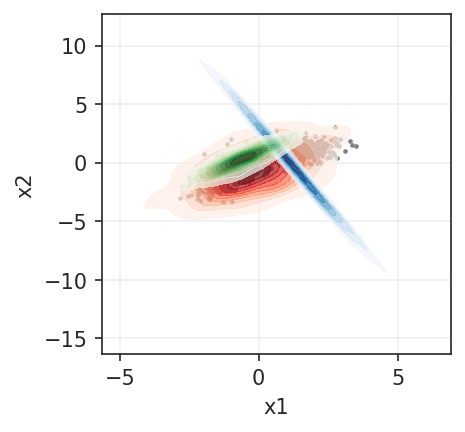

In [ ]:
import numpy as np
def get_random_psd(n=2):
    x = np.random.normal(0, 1, size=(n, n))
    return np.dot(x, x.transpose())
phi = np.random.uniform(0, 1)
psi = np.random.uniform(0, 1-phi)

params = {
    "phi" : phi,
    "psi" : psi, 

    "mu1" : np.random.normal(0, 1, size=2), # Центр распределения 1
    "mu2" : np.random.normal(0, 1, size=2), # Центр распределения 2
    "mu3" : np.random.normal(0, 1, size=2), # Центр распределения 3
    
    "sigma1": get_random_psd(), # У 2d Гауссианы таким образом задаётся дисперсия
    "sigma2" : get_random_psd(), # У 2d Гауссианы таким образом задаётся дисперсия
    "sigma3" : get_random_psd() # У 2d Гауссианы таким образом задаётся дисперсия
}

import scipy.stats as stats

hist1 = stats.multivariate_normal(params["mu1"], params["sigma1"]).rvs(size=1000)
hist2 = stats.multivariate_normal(params["mu2"], params["sigma2"]).rvs(size=1000)
hist3 = stats.multivariate_normal(params["mu3"], params["sigma3"]).rvs(size=1000)

fig, ax = plt.subplots(figsize=(3, 3), dpi=150)
sns.scatterplot(x="x1", y="x2", data=df, s=5, linewidth=0, ax=ax, color="grey")
sns.kdeplot(x=hist1[:, 0], y=hist1[:, 1], ax=ax, cmap="Reds", fill=True, alpha=0.7)
sns.kdeplot(x=hist2[:, 0], y=hist2[:, 1], ax=ax, cmap="Blues", fill=True, alpha=0.7)
sns.kdeplot(x=hist3[:, 0], y=hist3[:, 1], ax=ax, cmap="Greens", fill=True, alpha=0.7)
ax.grid(alpha=0.3)

In [ ]:
from scipy.special import logsumexp

X = df.values

def E_step(X, params, draw=False):
  LogLikelihood = A = np.log([
      stats.multivariate_normal(params["mu1"], params["sigma1"]).pdf(X), 
      stats.multivariate_normal(params["mu2"], params["sigma2"]).pdf(X),
      stats.multivariate_normal(params["mu3"], params["sigma3"]).pdf(X)
  ])
  logPrior = B = np.log([params["phi"],params["psi"],1 - params["phi"] - params["psi"]])
  logPosterior = D = logPrior + LogLikelihood.T
  RealSoftMax = C = logsumexp(logPosterior, axis=1)
  probabilities = np.exp(logPosterior - np.array([RealSoftMax]).T)

  if draw:
    hist1 = stats.multivariate_normal(params["mu1"], params["sigma1"]).rvs(size=1000)
    hist2 = stats.multivariate_normal(params["mu2"], params["sigma2"]).rvs(size=1000)
    hist3 = stats.multivariate_normal(params["mu3"], params["sigma3"]).rvs(size=1000)

    fig, axes = plt.subplots(figsize=(10, 3), dpi=150, ncols=4)
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=probabilities[:, 0], linewidth=0,
                    palette="coolwarm", ax=axes[1], s=3, alpha=1)
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=probabilities[:, 1], linewidth=0,
                    palette="coolwarm", ax=axes[2], s=3, alpha=1)
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=probabilities[:, 2], linewidth=0,
                    palette="coolwarm", ax=axes[3], s=3, alpha=1)
    sns.scatterplot(x=X[:, 0], y=X[:, 1], linewidth=0,
                    palette="coolwarm", ax=axes[0], s=3, alpha=1)
    sns.kdeplot(x=hist1[:, 0], y=hist1[:, 1], ax=axes[0], cmap="Reds", fill=True, alpha=0.5)
    sns.kdeplot(x=hist2[:, 0], y=hist2[:, 1], ax=axes[0], cmap="Blues", fill=True, alpha=0.5)
    sns.kdeplot(x=hist3[:, 0], y=hist3[:, 1], ax=axes[0], cmap="Greens", fill=True, alpha=0.5)
    axes[0].grid(alpha=0.3)
    axes[1].grid(alpha=0.3)
    axes[2].grid(alpha=0.3)
    axes[3].grid(alpha=0.3)
    axes[0].legend().remove()
    axes[1].legend().remove()
    axes[2].legend().remove()
    axes[3].legend().remove()
    plt.show()

  return RealSoftMax, probabilities

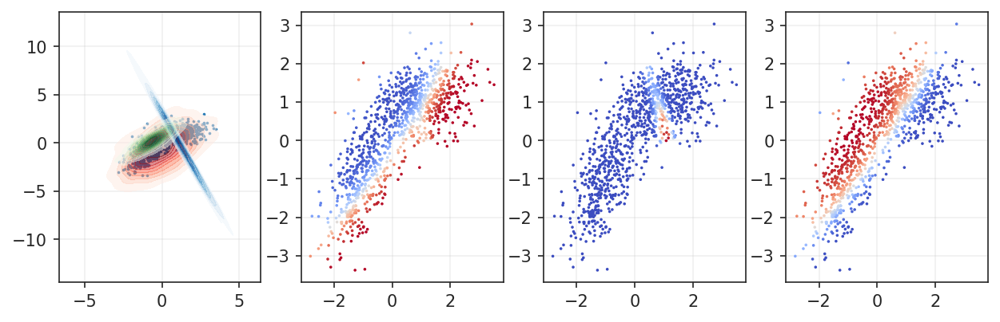

In [ ]:
total_prob, probabilities = E_step(X, params, draw=True)

In [ ]:
def M_step(X, params, probabilities):
  prob_1 = probabilities[:, 0]
  prob_2 = probabilities[:, 1]
  prob_3 = probabilities[:, 2]

  # Вычисление новых значений
  # Пропорция = prior
  phi = prob_1.sum() / len(X)
  psi = prob_2.sum() / len(X)

  # Среднее
  mu1 = prob_1.dot(X) / np.sum(prob_1)
  mu2 = prob_2.dot(X) / np.sum(prob_2)
  mu3 = prob_3.dot(X) / np.sum(prob_3)

  # Дисперсия
  sigma1 = (X - mu1).T.dot((X - mu1) * np.array([prob_1]).T) / np.sum(prob_1)
  sigma2 = (X - mu2).T.dot((X - mu2) * np.array([prob_2]).T) / np.sum(prob_2)
  sigma3 = (X - mu3).T.dot((X - mu3) * np.array([prob_3]).T) / np.sum(prob_3)
  
  return {
      "phi" : phi, "psi" : psi,
      "mu1" : mu1, "mu2" : mu2, "mu3" : mu3,
      "sigma1": sigma1, "sigma2": sigma2, "sigma3": sigma3
  }

In [ ]:
def run_EM(X, params, draw=False):
    import imageio
    avg_allprob = []

    while True:
        allprob, probabilities = E_step(X, params, draw=draw)
        avg_allprob.append(np.mean(allprob))
        if len(avg_allprob) > 2 and abs(avg_allprob[-1] - avg_allprob[-2]) < 0.00001:
            break
        params = M_step(X, params, probabilities)
        
    loglikelihood, probabilities = E_step(X, params)
    forecasts = np.argmax(probabilities, axis=1)
    return forecasts, probabilities, avg_allprob

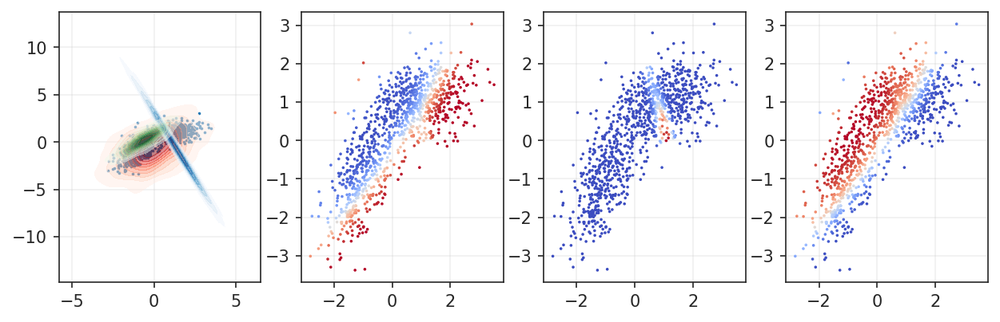

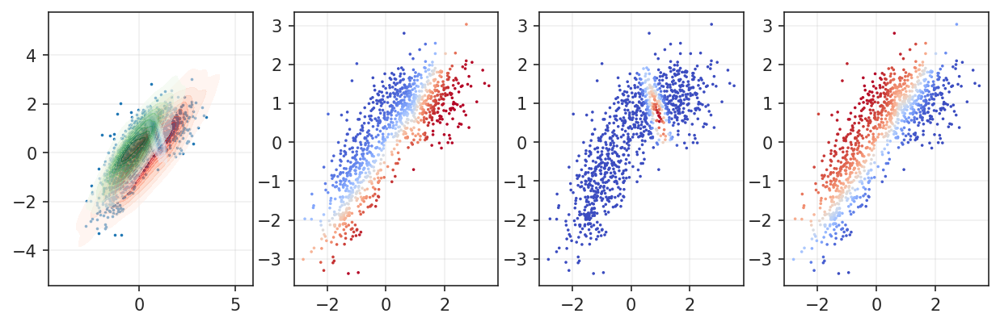

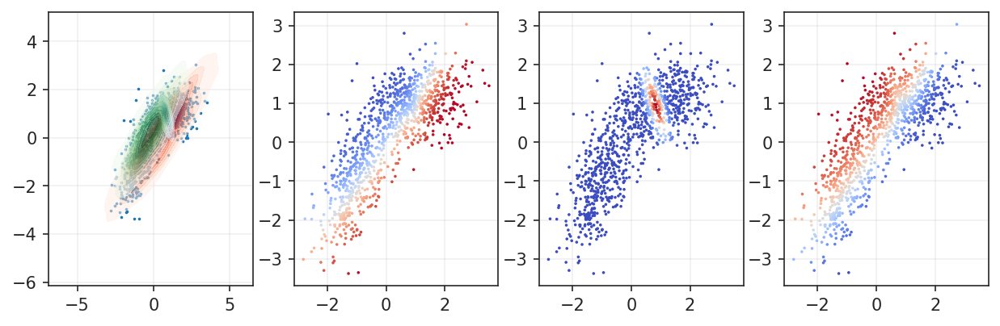

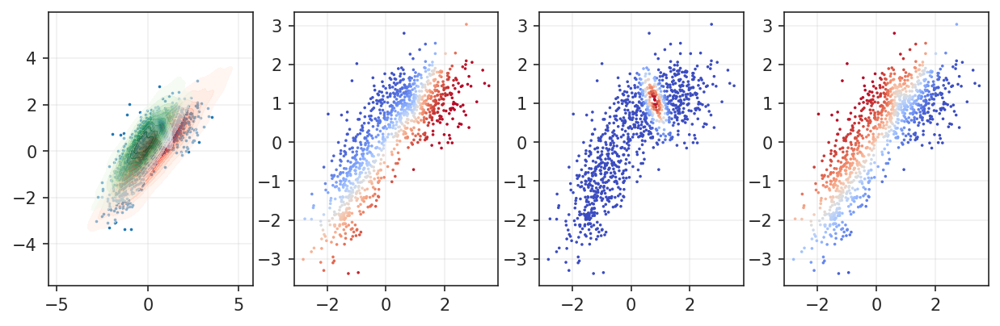

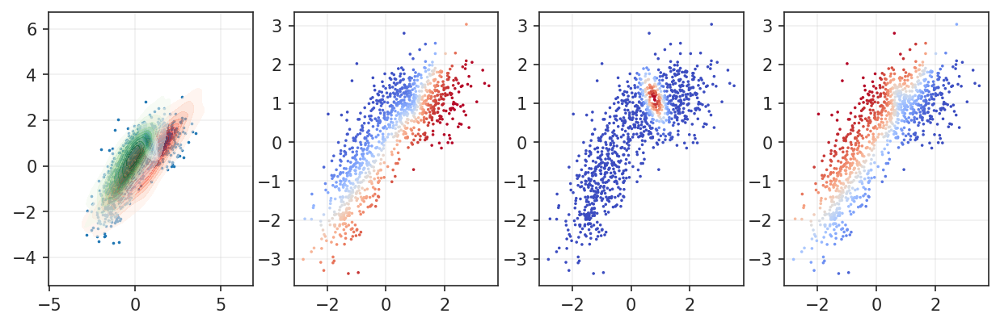

...

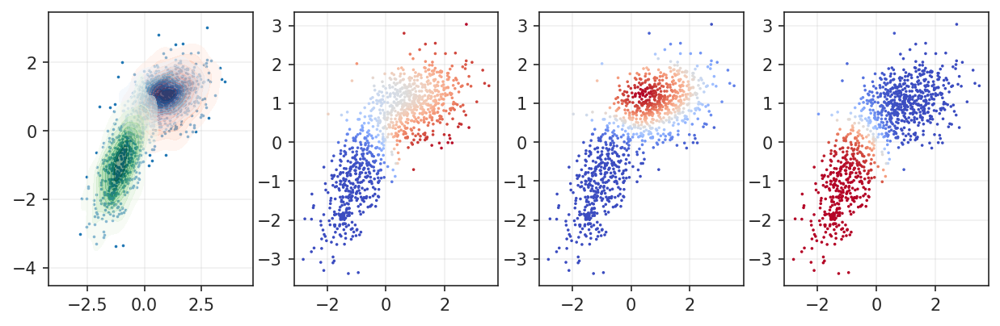

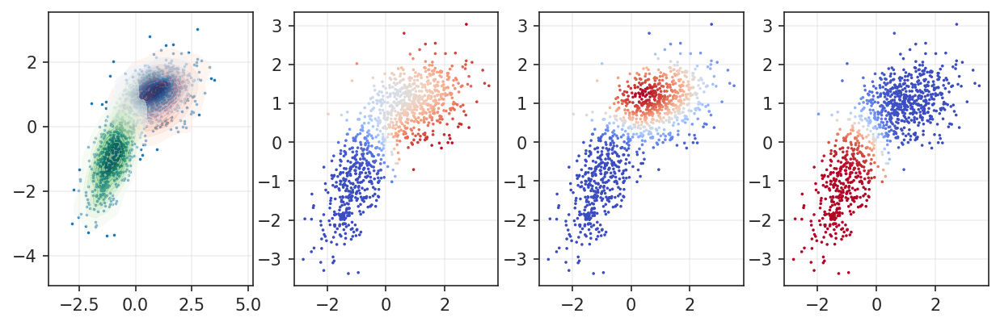

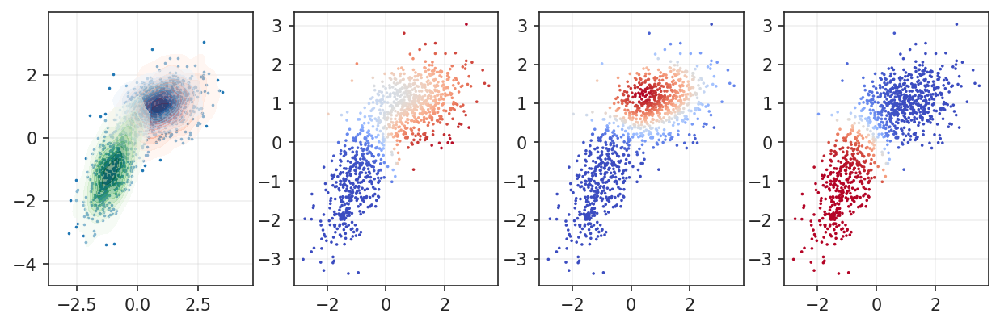

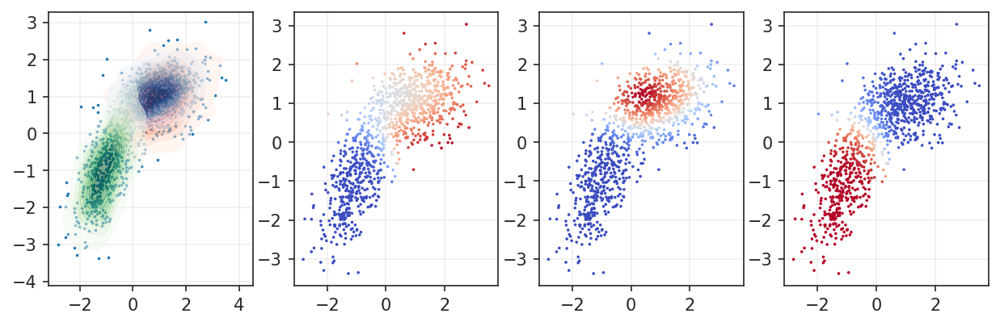

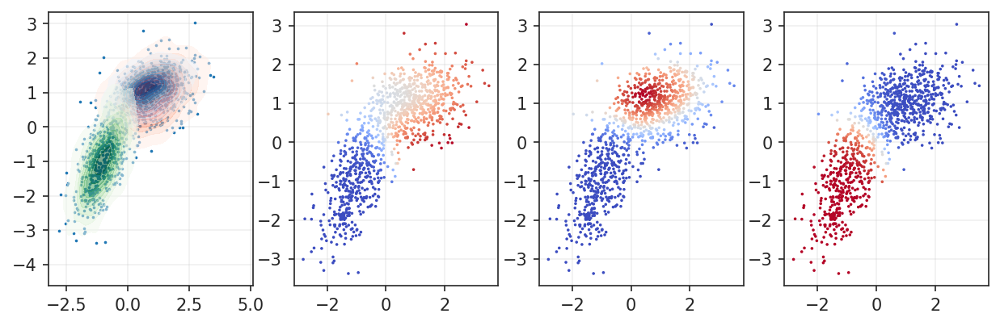

In [ ]:
pred, prob, allprob = run_EM(X, params, draw=True)

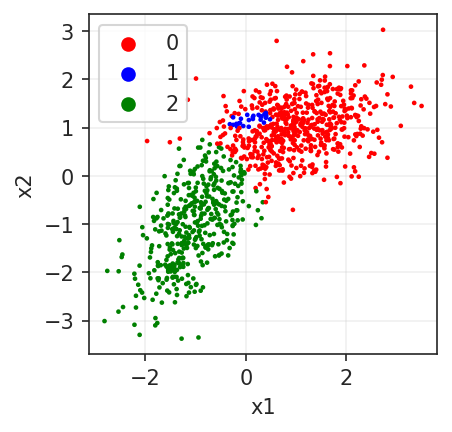

In [ ]:
fig, ax = plt.subplots(figsize=(3, 3), dpi=150)
sns.scatterplot(x="x1", y="x2", data=df, s=5, linewidth=0, ax=ax, hue=pred,
                palette={0: "red",
                         1: "blue",
                         2: "green"})
ax.grid(alpha=0.3)

Попробуйте сами написать алгоритм, который будет при помощи EM-алгоритма оценивать представленность экспрессию транскриптов (необязательно работать с графами или прочтениями, можете упростить ситуацию до модельной).